In [49]:
#importing library 
import numpy as np
import pandas as pd

# for visualization purpose
import matplotlib.pyplot as plt
from plotnine import ggplot, aes, geom_point, facet_wrap, theme, ggtitle # 별도 설치 필요 (pip install --user plotnine)

# for doing PCA
from sklearn.decomposition import PCA

# for t-SNE implemention 
from sklearn.manifold import TSNE

# for data loading
from sklearn.datasets import fetch_openml

# for comparing computation time
import time

In [2]:
pd.set_option('display.max_columns', 800)

In [3]:
mnist = fetch_openml('mnist_784')

C:\Users\80700\anaconda3\lib\site-packages\sklearn\datasets\_openml.py:1022: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.


In [5]:
df = mnist.data
columns_list = df.columns.to_list()

In [6]:
df.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pix

### 데이터 확인 및 정규화

In [7]:
df.describe()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pix

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Columns: 784 entries, pixel1 to pixel784
dtypes: float64(784)
memory usage: 418.7 MB


- 70000 * 784크기 데이터 (데이터 개수 : 70000개, 각 행은 28 * 28 크기의 matrix 값을 나타냄, 각 행의 정보가 숫자 하나를 나타냄)
- 결측치 없음
- 각 픽셀의 값이 0~255 사이의 값을 가짐
- 따라서 mnist data의 경우 보통 정규화하는 방식인 특성별 정규화를 하는 것이 아니라, 각 셀에 255를 나누는 방식으로 normalize해서 각 셀의 값이 0~1의 값을 갖도록 한다 

In [9]:
#정규화(각 픽셀 값이 0~1값을 가지도록)
df = df / 255.0

#라벨 추가(실제 값)
df['label'] = mnist.target

C:\Users\80700\AppData\Local\Temp\ipykernel_18140\1901962779.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


In [11]:
df.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pix

랜덤으로 데이터 순서를 섞고, 처음 30개를 plot으로 그려봄

In [12]:
np.random.seed(42)
index = np.random.permutation(df.shape[0]) # 랜덤 순서 추출

<Figure size 640x480 with 0 Axes>

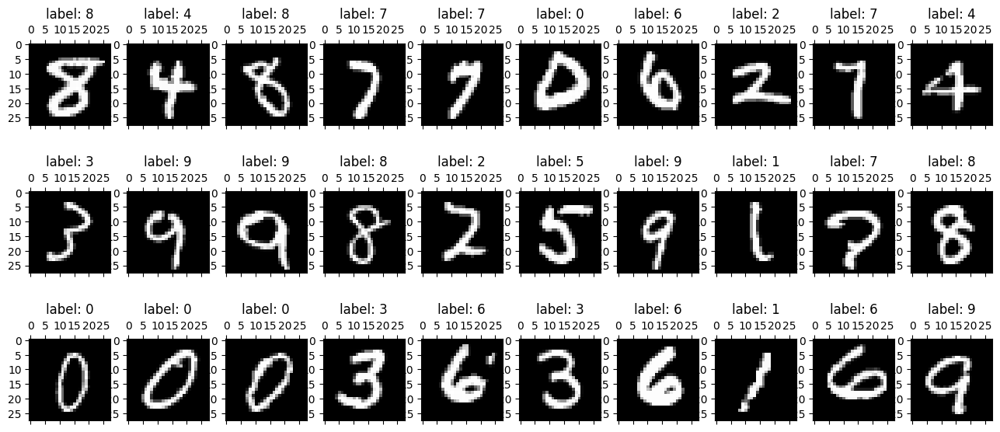

In [13]:
plt.gray()
fig = plt.figure(figsize = (16,7))
for i in range(0, 30):
    ax = fig.add_subplot(3, 10, i+1, title = 'label: ' + str(df.loc[index[i], 'label']))
    ax.matshow(df.loc[index[i], columns_list].values.reshape((28,28)).astype(float))


### 구현

#### PCA

In [14]:
pca = PCA(n_components = 2) #2차원으로 축소
pca_result1 = pca.fit_transform(df[columns_list].values)

In [15]:
pca_result1.shape

(70000, 2)

In [16]:
pca_result1

array([[ 0.47941631, -1.24058026],
       [ 3.96269951, -1.13740945],
       [-0.23135228,  1.54399009],
       ...,
       [-1.06471578,  2.3143854 ],
       [-1.2165255 , -0.45698673],
       [ 4.15238254, -0.32737566]])

#### t-sne

t-sne은 O(n^2)의 시간 복잡도를 가지기 때문에, 데이터 크기가 크면 시간이 너무 오래걸린다. 따라서 전체 데이터 중에서 7000개만 뽑아서 구현해 보았다.

In [17]:
# t-sne는 계산비용이 커서 7000개만 사용
n_sne = 7000 

# 계산 비용과 노이즈를 억제하기 위해 일차적으로 PCA를 통해 30차원으로 축소
pca = PCA(n_components=30)
pca_result = pca.fit_transform(df.loc[index[:n_sne], columns_list].values)

In [56]:
tsne_start_time = time.time()
tsne1 = TSNE(n_components = 2, perplexity = 2, n_iter = 300)
tsne_result1 = tsne1.fit_transform(pca_result)
tsne_elapsed_time = time.time() - tsne_start_time

tsne2 = TSNE(n_components = 2, perplexity = 30, n_iter = 300)
tsne_result2 = tsne2.fit_transform(pca_result)

tsne3 = TSNE(n_components = 2, perplexity = 50, n_iter = 300)
tsne_result3 = tsne3.fit_transform(pca_result)

tsne4 = TSNE(n_components = 2, perplexity = 100, n_iter = 300)
tsne_result4 = tsne4.fit_transform(pca_result)

tsne5 = TSNE(n_components = 2, perplexity = 1000, n_iter = 300)
tsne_result5 = tsne5.fit_transform(pca_result)

tsne6 = TSNE(n_components = 2, perplexity = 5000, n_iter = 300)
tsne_result6 = tsne6.fit_transform(pca_result)

- Perplexity에 따라 결과가 어떻게 바뀌는지 보기 위해 perplexity를 2, 30, 50, 100, 1000, 5000으로 변경해가며 실행한 결과를 저장했다.
- Perplexity가 커질수록 mean sigma 값도 커지는 것을 확인할 수 있다.

### 시각화

패키지 설치(pip install --user plotnine)후 재시작

## T-SNE

### Perplexity

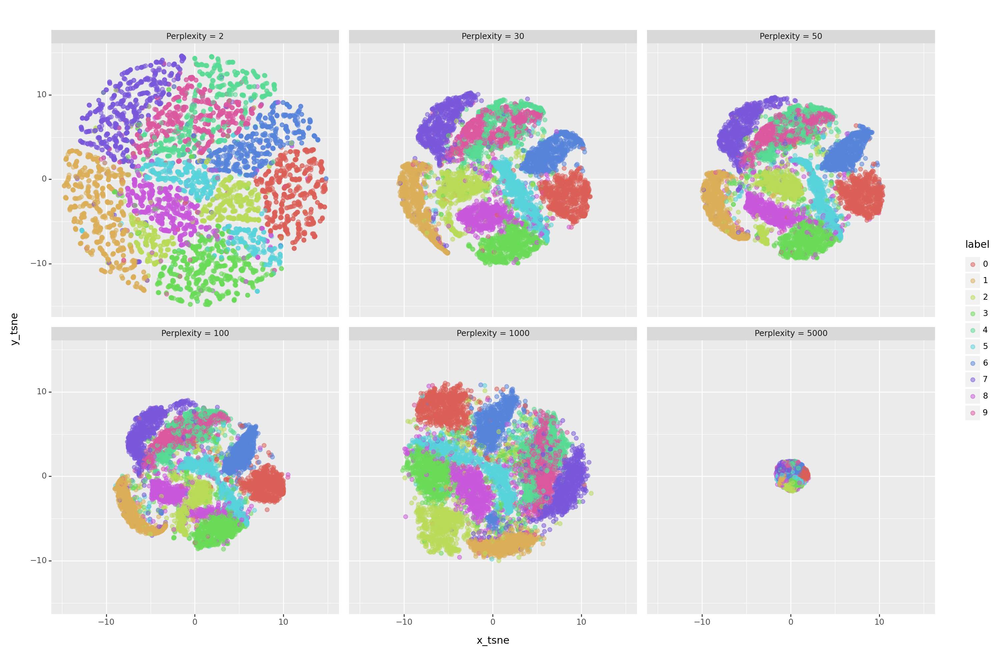

In [57]:
from plotnine import ggplot, aes, geom_point, facet_wrap
import pandas as pd

# Create a DataFrame to store all tsne_results
df_list = []

perplexities = [2, 30, 50, 100, 1000, 5000]

# Convert 'result' to a categorical type with a specified order
perplexity_order = pd.Categorical(['Perplexity = {}'.format(p) for p in perplexities], categories=['Perplexity = {}'.format(p) for p in perplexities])

for i, tsne_result in enumerate([tsne_result1, tsne_result2, tsne_result3, tsne_result4, tsne_result5, tsne_result6]):
    df_tsne = df.loc[index[:n_sne], :].copy()
    df_tsne['x_tsne'] = tsne_result[:, 0]
    df_tsne['y_tsne'] = tsne_result[:, 1]
    df_tsne['result'] = 'Perplexity = {}'.format(perplexities[i])
    df_list.append(df_tsne)

# Combine all results into a single DataFrame
df_combined = pd.concat(df_list, ignore_index=True)

# Set the order of the 'result' column based on perplexity_order
df_combined['result'] = pd.Categorical(df_combined['result'], categories=perplexity_order, ordered=True)

# Plot using ggplot with facet_wrap and adjusted figure size
chart = ggplot(df_combined, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + facet_wrap('~result', ncol=3) + theme(figure_size=(15, 10))
chart.draw()


위 plot을 하나씩 확대한 버전은 아래 plot들과 같다

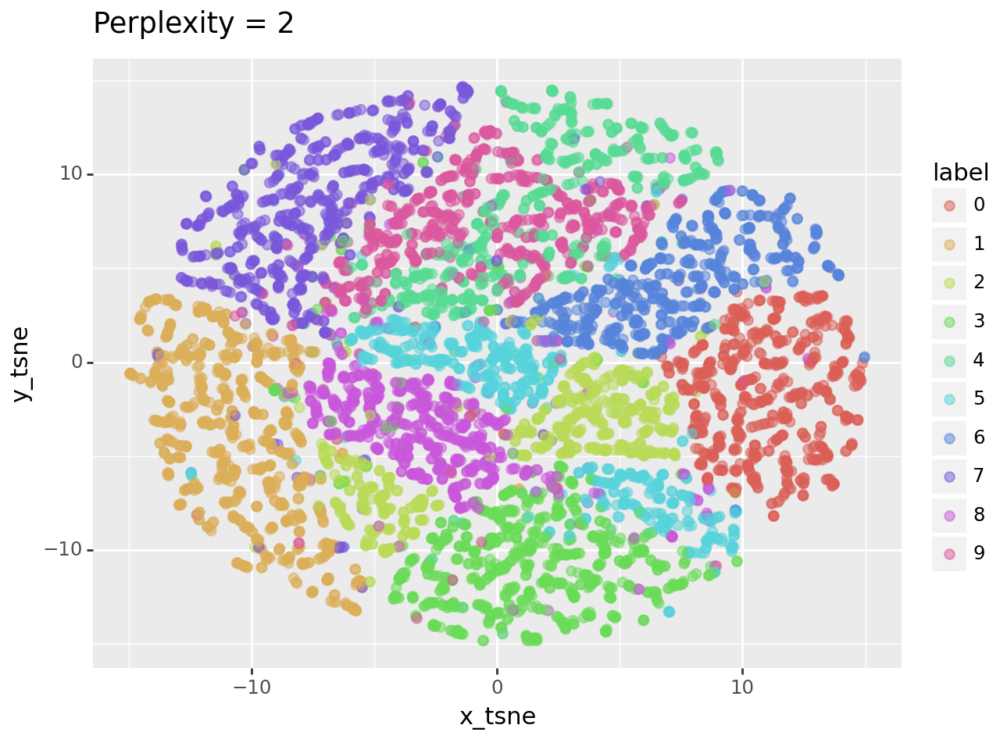

<Figure Size: (640 x 480)>

In [50]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result1[:, 0]
df_tsne['y_tsne'] = tsne_result1[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('Perplexity = 2')
chart

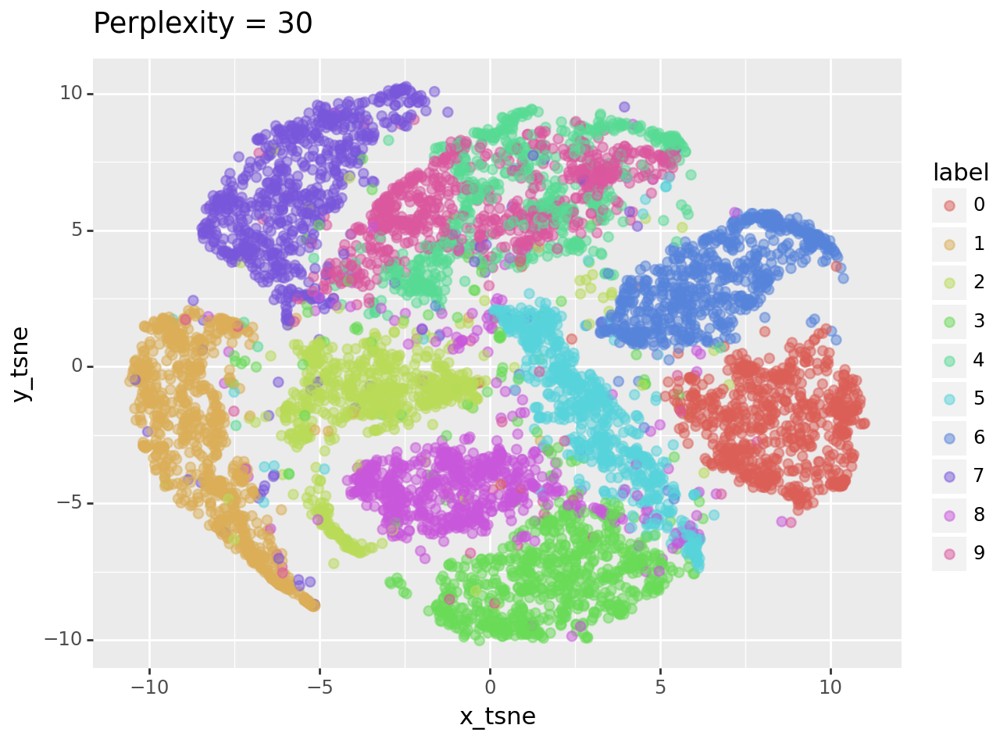

<Figure Size: (640 x 480)>

In [51]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result2[:, 0]
df_tsne['y_tsne'] = tsne_result2[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('Perplexity = 30')
chart

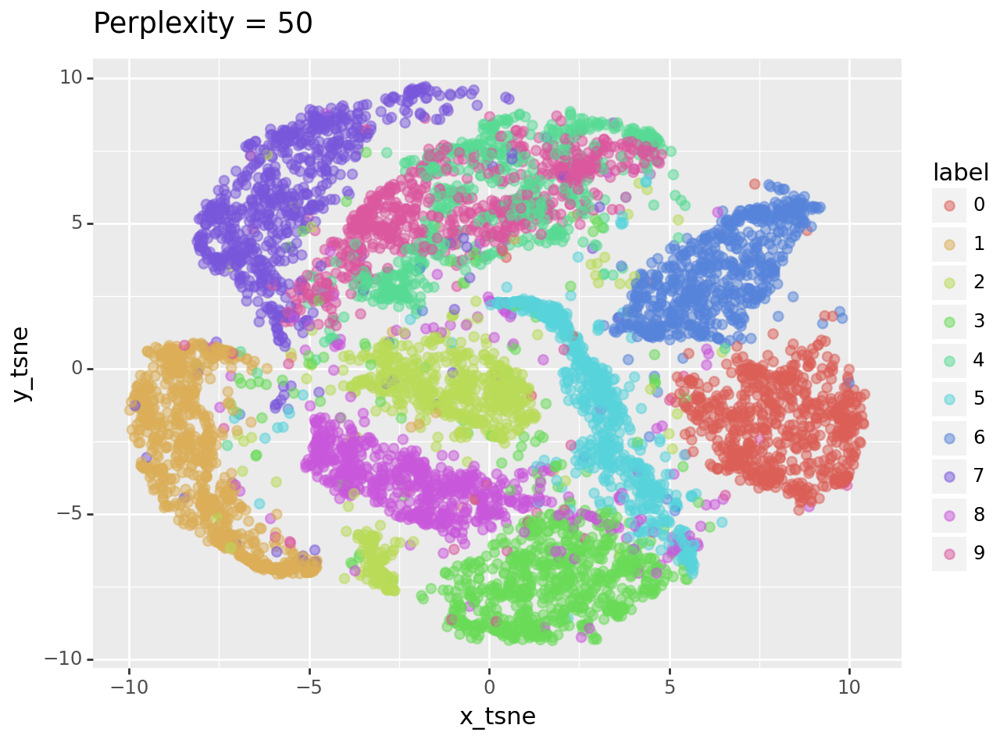

<Figure Size: (640 x 480)>

In [52]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result3[:, 0]
df_tsne['y_tsne'] = tsne_result3[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('Perplexity = 50')
chart

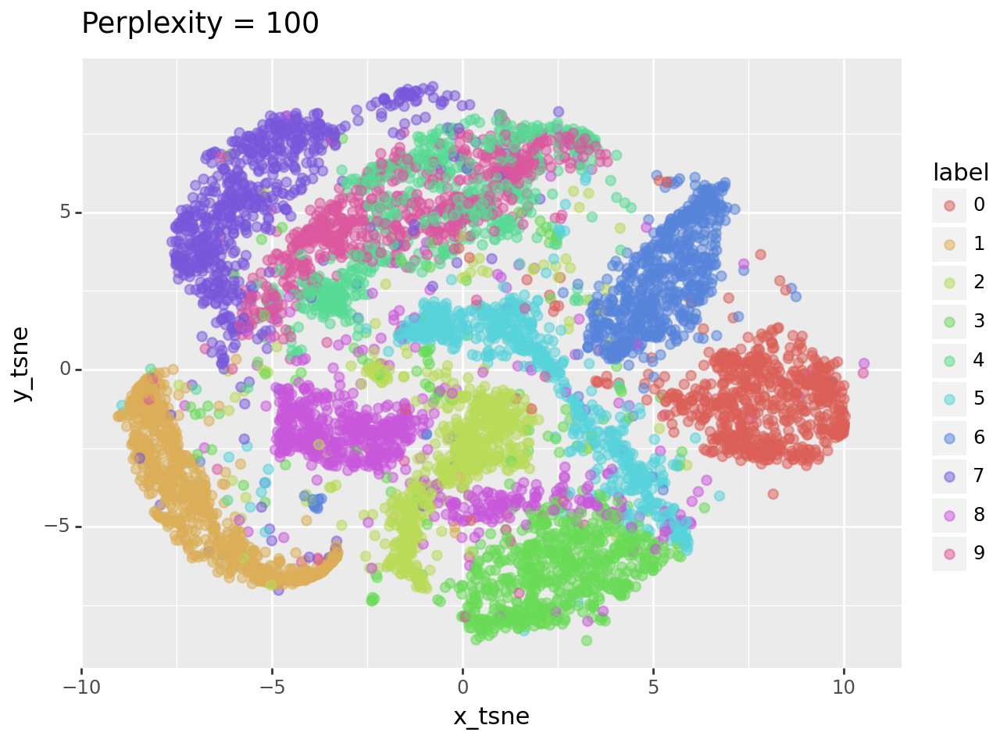

<Figure Size: (640 x 480)>

In [53]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result4[:, 0]
df_tsne['y_tsne'] = tsne_result4[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('Perplexity = 100')
chart

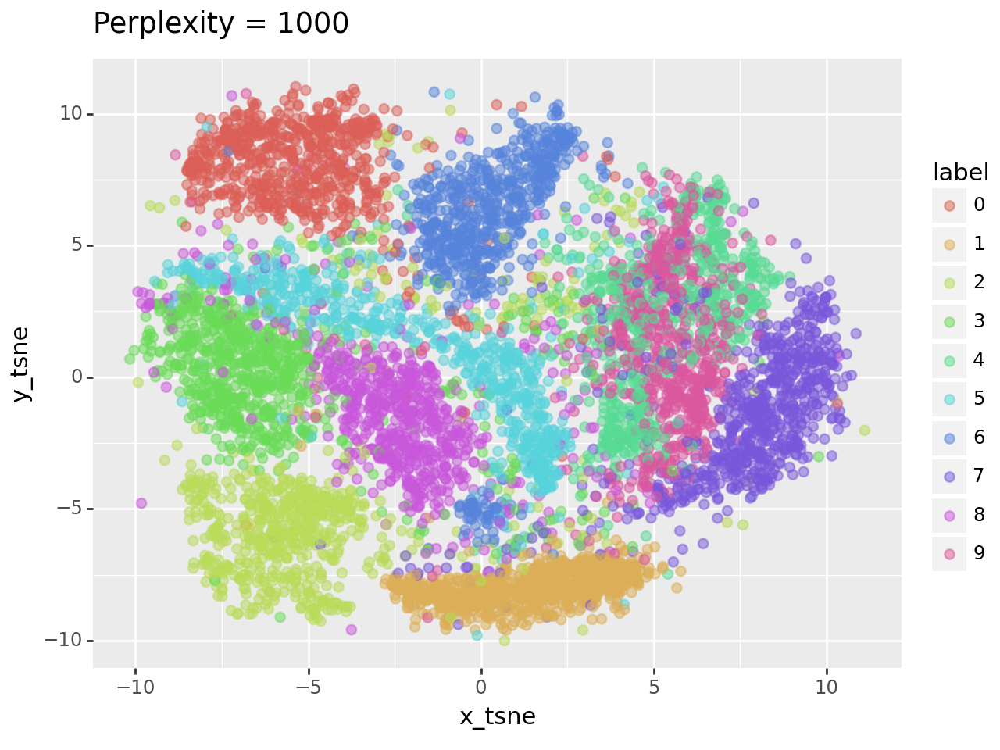

<Figure Size: (640 x 480)>

In [59]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result5[:, 0]
df_tsne['y_tsne'] = tsne_result5[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('Perplexity = 1000')
chart

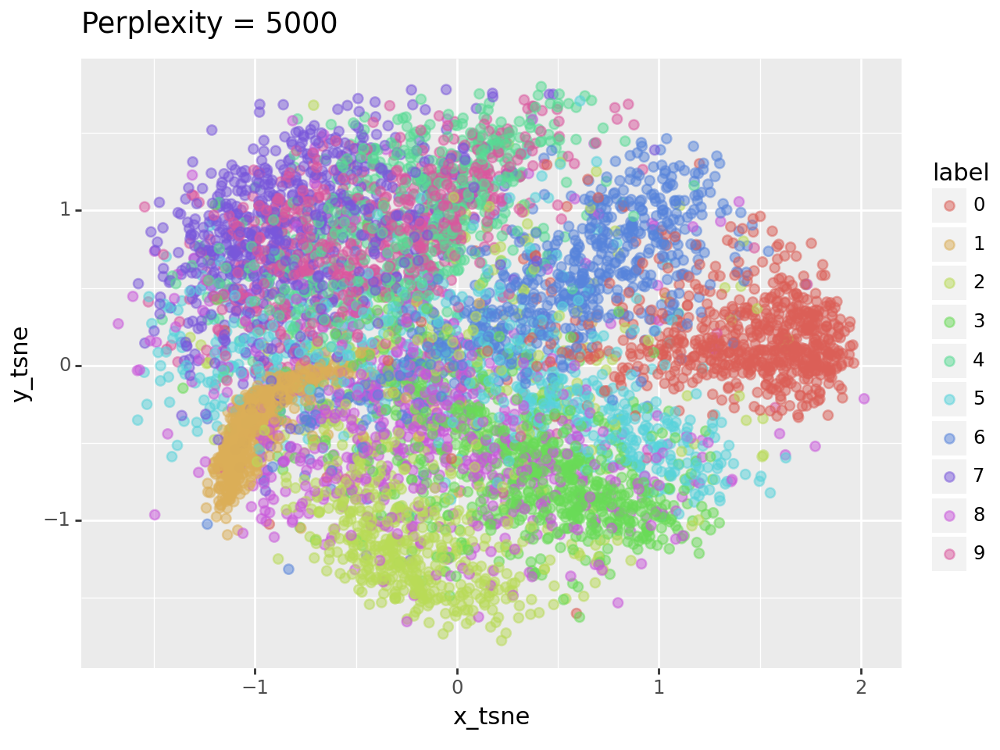

<Figure Size: (640 x 480)>

In [60]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result6[:, 0]
df_tsne['y_tsne'] = tsne_result6[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('Perplexity = 5000')
chart

- Perplexity가 너무 작거나 크지만 않으면 군집이 잘 형성 ->  robust
- 단 데이터 수에 비해 perplexity가 너무 크면 군집을 제대로 형성하지 못하고 점들이 균질하게 분포한다
- 이는 perplexity가 너무 크면 local한 구조를 보존하지 못하기 때문이다.
- 즉 더 많은 이웃을 포함하며 작은 그룹이 무시
- perplexity는 5~50사이로 지정하는 것이 좋고, 데이터 크기 보다 작아야 한다
- 데이터 크기가 크면 perplexity를 좀 크게 설정하는 것이 좋다
- Perplexity가 작으면 주변 데이터 포인트를 적게 고려하게 되어 국소적인 구조에 과도하게 강조. 이는 전역적인 구조를 놓치게 되고, 특히 클러스터 간 거리를 적절히 표현하지 못함.

### Learning rate

In [98]:
tsne_results = []
learning_rate = [0.1, 100, 1000, 5000, 10000, 30000]

for learn in learning_rate:
    # Create and fit t-SNE model
    tsne = TSNE(n_components=2, learning_rate = learn, random_state=42)
    tsne_result = tsne.fit_transform(df.loc[index[:n_sne], :])

    # Append the result to the list
    tsne_results.append(tsne_result)

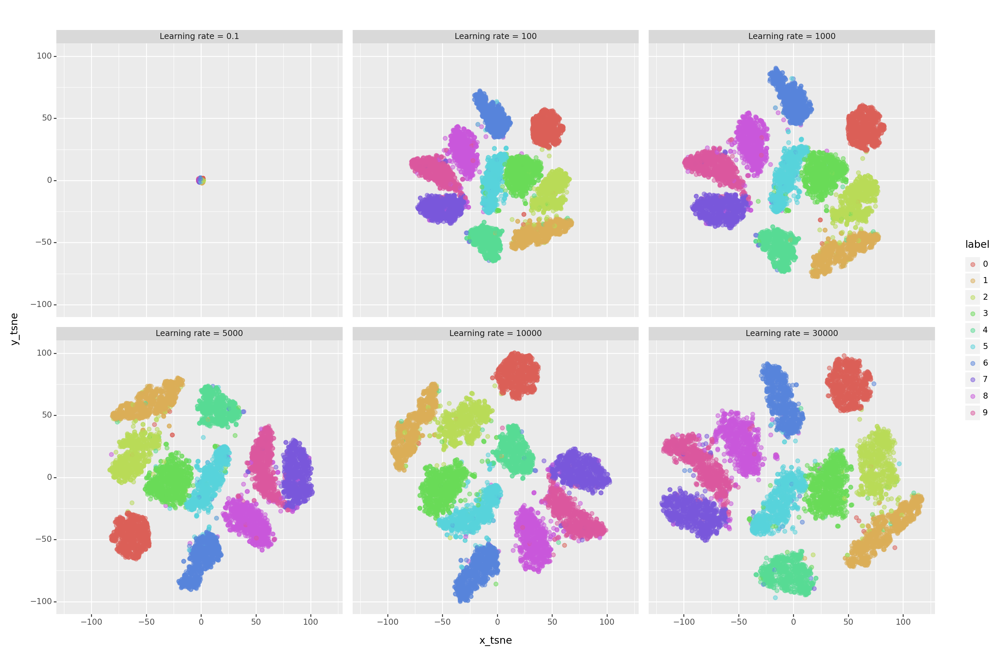

In [99]:
# Create a DataFrame to store all tsne_results
df_list = []
learn_order = pd.Categorical(['Learning rate = {}'.format(i) for i in learning_rate], categories=['Learning rate = {}'.format(i) for i in learning_rate])


for i, learn in enumerate(learning_rate):
    tsne_result = tsne_results[i]  # Assuming tsne_results is a list containing your t-SNE results
    df_tsne = df.loc[index[:n_sne], :].copy()
    df_tsne['x_tsne'] = tsne_result[:, 0]
    df_tsne['y_tsne'] = tsne_result[:, 1]
    df_tsne['result'] = 'Learning rate = {}'.format(learn)
    df_list.append(df_tsne)

# Combine all results into a single DataFrame
df_combined = pd.concat(df_list, ignore_index=True)
df_combined['result'] = pd.Categorical(df_combined['result'], categories=learn_order, ordered=True)

# Plot using ggplot with facet_wrap and adjusted figure size
chart = ggplot(df_combined, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + facet_wrap('~result', ncol=3) + theme(figure_size=(15, 10))
chart.draw()


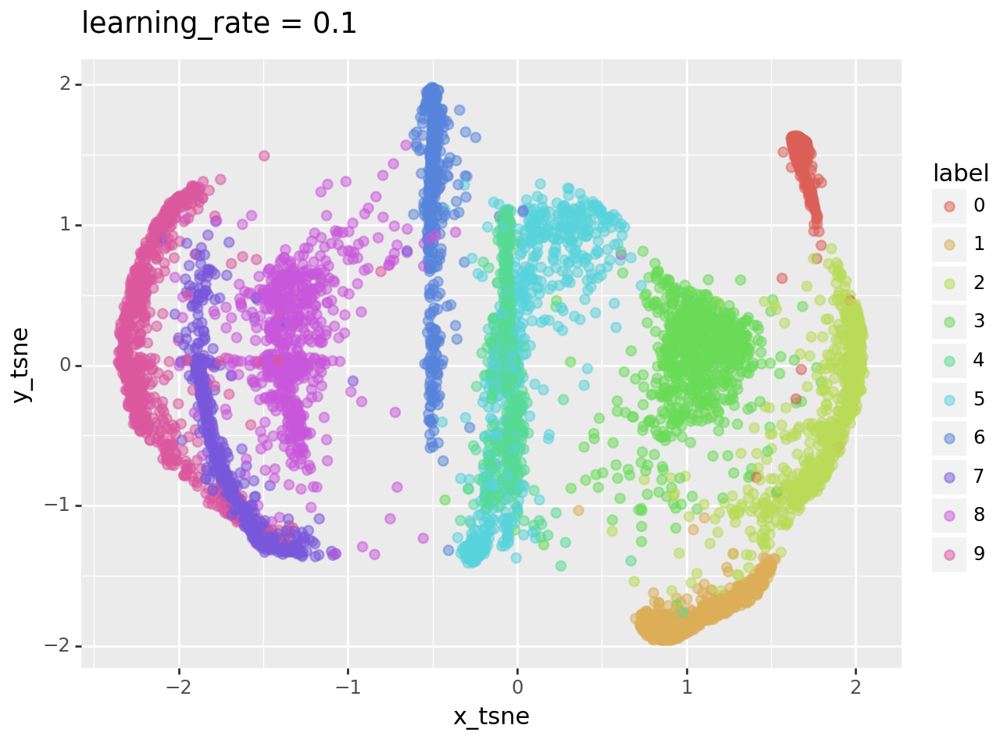

<Figure Size: (640 x 480)>

In [102]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_results[0][:, 0]
df_tsne['y_tsne'] = tsne_results[0][:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('learning_rate = 0.1')
chart

learning rate가 너무 큰 경우를 확인하기 위해 추가적으로 learning rate = 50000으로 설정해 돌려본 결과

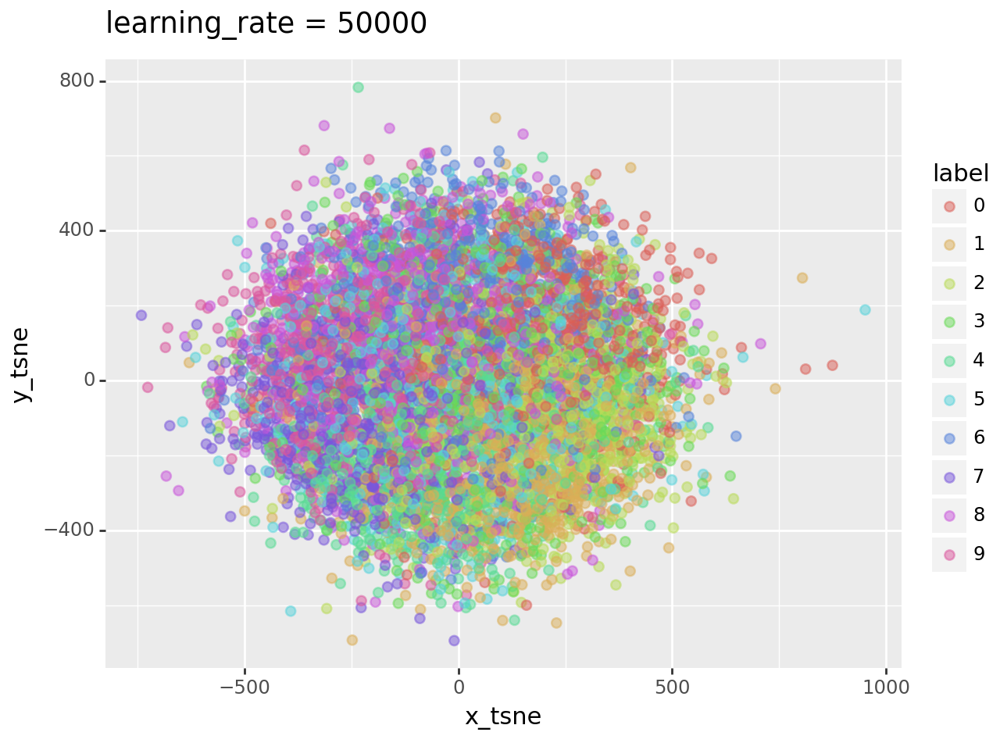

<Figure Size: (640 x 480)>

In [104]:
tsne7 = TSNE(n_components=2, learning_rate = 50000, random_state=42)
tsne_result7 = tsne7.fit_transform(df.loc[index[:n_sne], :])

df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result7[:, 0]
df_tsne['y_tsne'] = tsne_result7[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('learning_rate = 50000')
chart

- learning rate는 일반적으로 10~1000 사이 값을 사용
- learning rate의 기본값은 max(N/ early_exaggeration / 4, 50) where N is the sample size, early_exaggeration = 12. mnist data의 경우 약 145이다.
- learning rate가 너무 높으면 데이터가 가장 가까운 이웃과 거의 같은 거리에있는 ‘공’처럼 보일 수 있음
- 반면 learning rate가 너무 낮으면 대부분의 포인트가 특이치가 거의 없는 조밀 한 클라우드에서 압축 된 것처럼 보일 수 있음
- 또한 learning rate가 너무 낮으면 local minimum에 빠질 수 있다. 이 경우 learning rate를 증가시켜주면 해결된다

추가적으로 scikit-learn의 t-sne에는 모멘텀을 조정하는 하이퍼파라미터가 따로 없다
이는 이 알고리즘이 사용하는 최적화 프로세스가 신경망 및 모멘텀이 일반적으로 적용되는 다른 머신 러닝 모델에서 사용되는 경사 하강 최적화와 근본적으로 다르기 때문이라고 한다.

## PCA

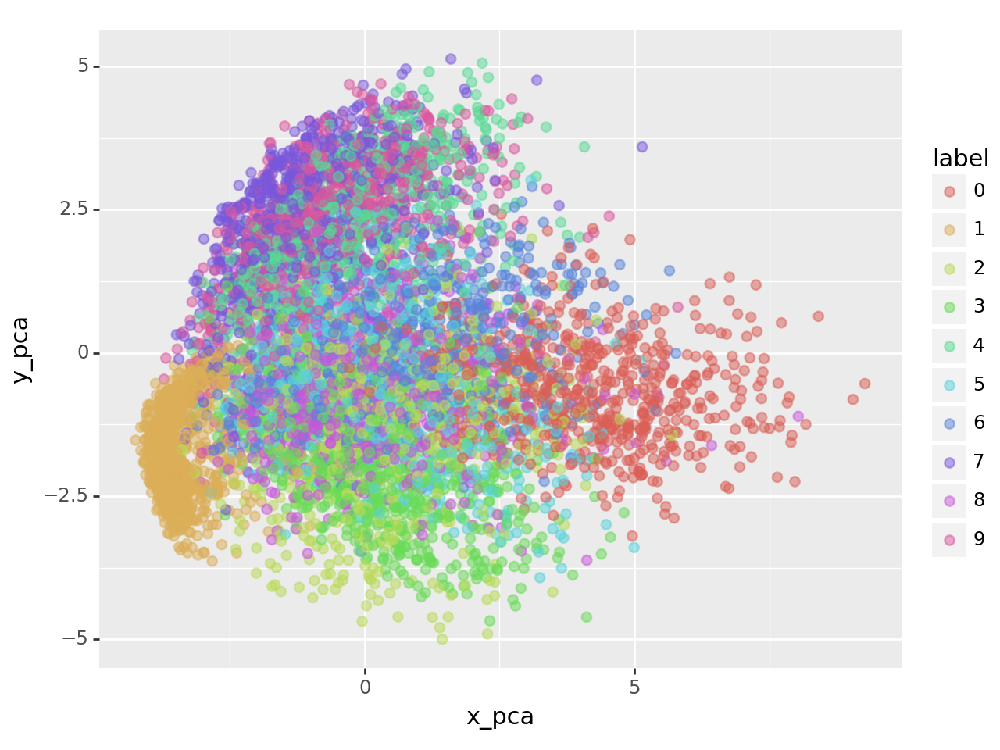

<Figure Size: (640 x 480)>

In [61]:
# pca 결과
df_pca = df.copy()
df_pca['x_pca'] = pca_result1[:, 0]
df_pca['y_pca'] = pca_result1[:, 1]

df_pca_7000 = df_pca.loc[index[:n_sne],:].copy() # t-sne 와 비교하기 위해 마찬가지로 7000개만 추출

chart = ggplot(df_pca_7000, aes(x='x_pca', y='y_pca', color='label')) + geom_point(size=2, alpha=0.5)
chart


- 0과 1은 어느정도 구분되나, 나머지 숫자에 대해선 2차원 상에서 거의 구분하지 못한다

#### UMAP

In [105]:
from umap import UMAP

만약 패키지 설치가 안된다면 ?
https://pypi.org/project/umap-learn/ 참고 or 구글링 or chatgpt

In [123]:
umap_start_time = time.time()
umap1 = UMAP(n_components=2, n_neighbors=5, min_dist=0.25)
umap_result1 = umap1.fit_transform(pca_result)
umap_elapsed_time = time.time() - umap_start_time

umap2 = UMAP(n_components=2, n_neighbors=15, min_dist=0.25)
umap_result2 = umap2.fit_transform(pca_result)

umap3 = UMAP(n_components=2, n_neighbors=100, min_dist=0.25)
umap_result3 = umap3.fit_transform(pca_result)

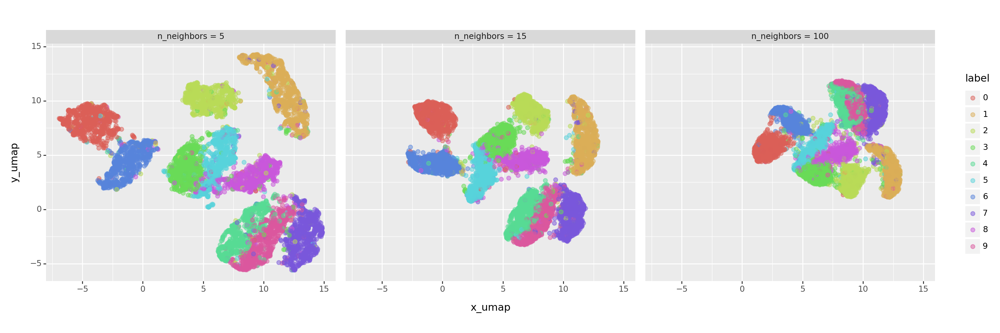

In [124]:
df_list = []

num_neighbors = [5, 15, 100]

# Convert 'result' to a categorical type with a specified order
neighbor_order = pd.Categorical(['n_neighbors = {}'.format(i) for i in num_neighbors], categories=['n_neighbors = {}'.format(i) for i in num_neighbors])

for i, umap_result in enumerate([umap_result1, umap_result2, umap_result3]):
    df_umap = df.loc[index[:n_sne], :].copy()
    df_umap['x_umap'] = umap_result[:, 0]
    df_umap['y_umap'] = umap_result[:, 1]
    df_umap['result'] = 'n_neighbors = {}'.format(num_neighbors[i])
    df_list.append(df_umap)

# Combine all results into a single DataFrame
df_combined = pd.concat(df_list, ignore_index=True)

# Set the order of the 'result' column based on perplexity_order
df_combined['result'] = pd.Categorical(df_combined['result'], categories=neighbor_order, ordered=True)

# Plot using ggplot with facet_wrap and adjusted figure size
chart = ggplot(df_combined, aes(x='x_umap', y='y_umap', color='label')) + geom_point(size=2, alpha=0.5) + facet_wrap('~result', ncol=3) + theme(figure_size=(15, 5))
chart.draw()


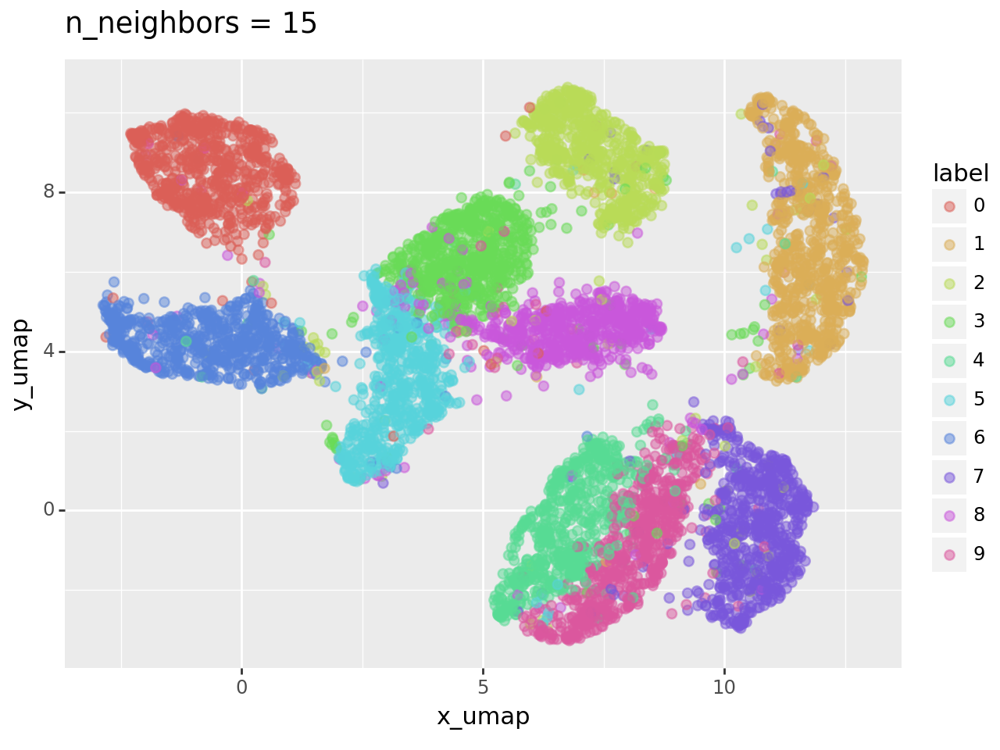

<Figure Size: (640 x 480)>

In [126]:
df_umap = df.loc[index[:n_sne], :].copy()
df_umap['x_umap'] = umap_result2[:, 0]
df_umap['y_umap'] = umap_result2[:, 1]

chart = ggplot(df_umap, aes(x='x_umap', y='y_umap', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('n_neighbors = 15')
chart

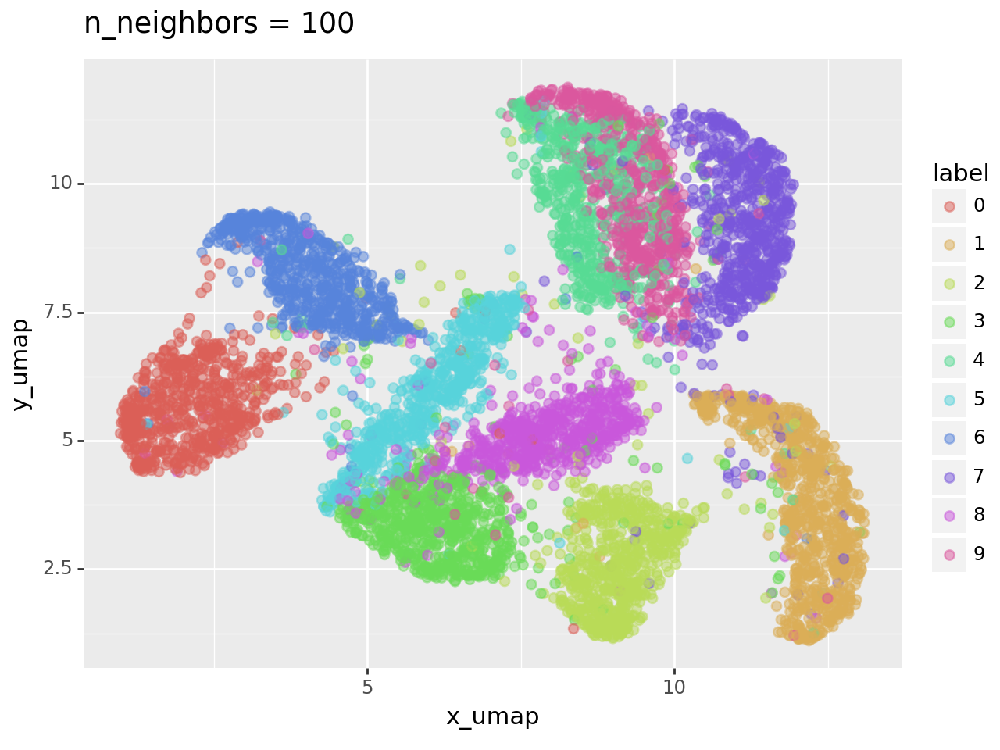

<Figure Size: (640 x 480)>

In [125]:
df_umap = df.loc[index[:n_sne], :].copy()
df_umap['x_umap'] = umap_result3[:, 0]
df_umap['y_umap'] = umap_result3[:, 1]

chart = ggplot(df_umap, aes(x='x_umap', y='y_umap', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('n_neighbors = 100')
chart

- 시각화가 t-sne보다 잘됨
- n_neighbors가 작으면 보다 local한 구조를 잘 살림
- nearest neighbors은 t-sne에서 perplexity와 같은 개념이라 볼 수 있음

### T-SNE vs UMAP

In [127]:
print(f"T-SNE 소요 시간: {tsne_elapsed_time} 초")

T-SNE 소요 시간: 10.662742137908936 초


In [128]:
print(f"UMAP 소요 시간: {umap_elapsed_time} 초")

UMAP 소요 시간: 6.471599102020264 초


UMAP이 더 빠르다.

## 결과분석

결과를 분석하기 위해 가장 결과가 잘 나온 t-sne plot을 가져온다

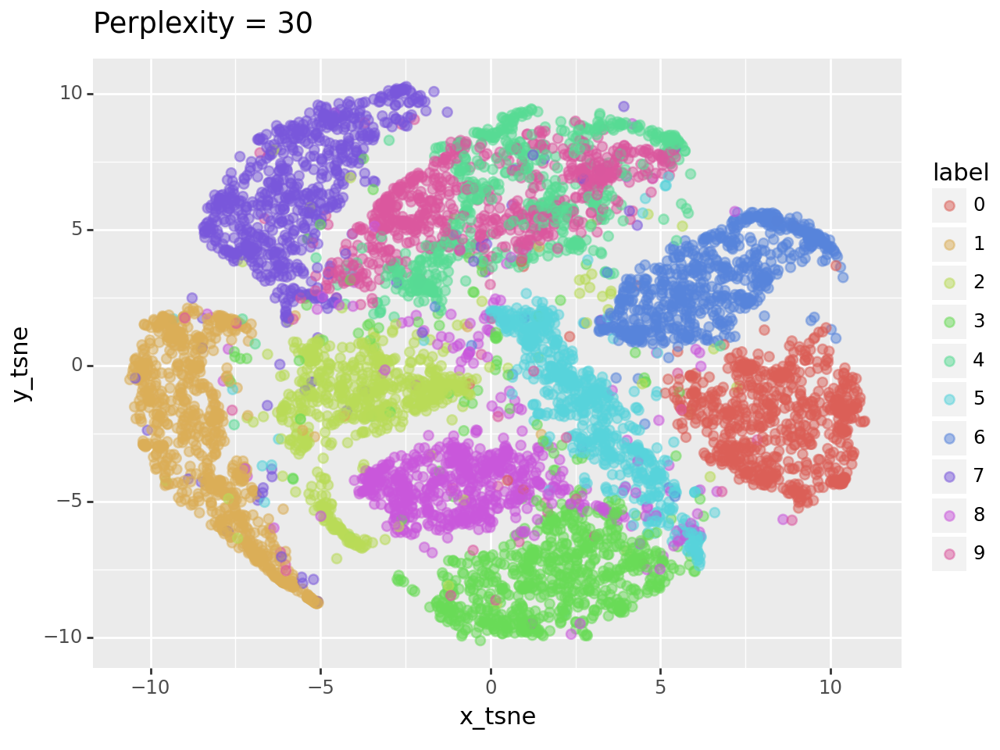

<Figure Size: (640 x 480)>

In [129]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result2[:, 0]
df_tsne['y_tsne'] = tsne_result2[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5) + ggtitle('Perplexity = 30')
chart

- 4와 9의 군집이 겹쳐져 있음
- 8, 3, 5의 군집이 가까이 위치하며 이상치가 서로의 군집에 포함되어 있다
- 7의 이상치가 주로 9의 군집에 포함되어 있음
- 숫자가 비슷하게 생긴 것들끼리 군집이 겹쳐져 있다

단, 군집 간의 거리는 t-sne의 특성상 정확치 않다. https://hongl.tistory.com/175 참고